In [1]:
library(tidyverse)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ dplyr   1.0.7
✔ tidyr   1.1.4     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [5]:
library(sharp)
library(arrow)


Attaching package: ‘arrow’


The following object is masked from ‘package:utils’:

    timestamp




In [8]:
dfx <- read_parquet("../output/04_lasso_multivariate/data/bhs_complete_cases_x_one_hot_data.parquet")
dfy <- read_parquet("../output/04_lasso_multivariate/data/bhs_complete_cases_y_data.parquet")

In [7]:
dfx

waist.0.0,hip.0.0,height_stand.0.0,height_seat.0.0,townsend_deprivation_index.0.0,BMI.0.0,weight.0.0,age.0.0,pm10_2010.0.0,pm2.5_2010.0.0,⋯,history_cancer_ICD.0.0_V82 Special screening for other conditions,history_cancer_ICD.0.0_V820 Special screening for skin conditions,history_cancer_ICD.0.0_V821 Special screening for rheumatoid arthritis,history_cancer_ICD.0.0_V822 Special screening for other rheumatic disorders,history_cancer_ICD.0.0_V823 Special screening for congenital dislocation of hip,history_cancer_ICD.0.0_V824 Postnatal screening for chromosomal anomalies,history_cancer_ICD.0.0_V825 Special screening for chemical poisoning and other contamination,history_cancer_ICD.0.0_V826 Multiphasic screening,history_cancer_ICD.0.0_V828 Other special screening for other conditions,history_cancer_ICD.0.0_V829 Unspecified special screening for other conditions
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
72,90,158.0,132,0.892717,23.2735,58.1,46,15.73,9.72,⋯,0,0,0,0,0,0,0,0,0,0
71,90,145.0,118,3.775130,27.1581,57.1,54,18.26,13.67,⋯,0,0,0,0,0,0,0,0,0,0
99,102,179.0,135,-3.176220,24.3126,77.9,68,16.05,9.74,⋯,0,0,0,0,0,0,0,0,0,0
74,95,162.0,139,-4.785160,23.7388,62.3,55,16.70,9.89,⋯,0,0,0,0,0,0,0,0,0,0
120,115,178.0,131,-2.800230,31.8773,101.0,54,16.39,10.24,⋯,0,0,0,0,0,0,0,0,0,0
85,94,187.0,146,4.512220,20.8184,72.8,62,15.54,10.59,⋯,0,0,0,0,0,0,0,0,0,0
88,94,179.0,143,0.522843,25.7795,82.6,50,16.04,9.93,⋯,0,0,0,0,0,0,0,0,0,0
145,145,177.0,144,-5.314970,46.1872,144.7,61,16.13,8.68,⋯,0,0,0,0,0,0,0,0,0,0
105,115,191.0,146,-4.316920,29.0836,106.1,65,16.36,9.85,⋯,0,0,0,0,0,0,0,0,0,0


In [23]:
table(dfx[["daily_cigarettes.0.0_Less than one a day"]], useNA="always")


   0    1 <NA> 
6961    1    0 

In [24]:
table(dfx[["vascular_diagnosis.0.0_Heart attack"]], useNA="always")


   0 <NA> 
6962    0 

In [9]:
dfy

delta_bhs,delta_bhs_b,delta_biomarker_bhs
<dbl>,<dbl>,<dbl>
-0.16666667,-0.06666667,0.15000000
0.20000000,0.20000000,0.31666667
0.00000000,0.10000000,0.31666667
0.05000000,-0.05000000,0.11666667
0.16666667,0.16666667,0.50000000
0.15000000,0.15000000,0.43333333
0.25000000,0.15000000,0.53333333
0.10000000,0.10000000,0.46666667
-0.05000000,-0.15000000,0.05000000


In [10]:
dfy[,1]

delta_bhs
<dbl>
-0.16666667
0.20000000
0.00000000
0.05000000
0.16666667
0.15000000
0.25000000
0.10000000
-0.05000000


In [27]:
head(dfy[,2], 10)

delta_bhs_b
<dbl>
-0.06666667
0.20000000
0.10000000
-0.05000000
0.16666667
0.15000000
0.15000000
0.10000000
-0.15000000


In [28]:
VariableSelection(
    xdata = head(dfx, 30),
    ydata = head(dfy[,1], 30)
)

  |======================================================================| 100%



Stability selection using function PenalisedRegression with gaussian family.
The model was run using 100 subsamples of 50% of the observations.

In [37]:
testStab <- VariableSelection(
    xdata = head(dfx, 300),
    ydata = head(dfy[,1], 300)
)

  |======================================================================| 100%



In [38]:
testStab

Stability selection using function PenalisedRegression with gaussian family.
The model was run using 100 subsamples of 50% of the observations.

In [39]:
SelectedVariables(testStab)

waist.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                      hip.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                             height_stand.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                              height_seat.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                               townsend_deprivation_index.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                      BMI.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                   weight.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                      age.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                pm10_2010.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                               pm2.5_2010.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                           pm2.5_abs_2010.0.0 
                                                                                                                                                                         

In [40]:
summary(testStab)

Calibrated parameters: lambda = 3.704 and pi = 0.990

Maximum stability score: 1198.541

Number of selected variable(s): 1


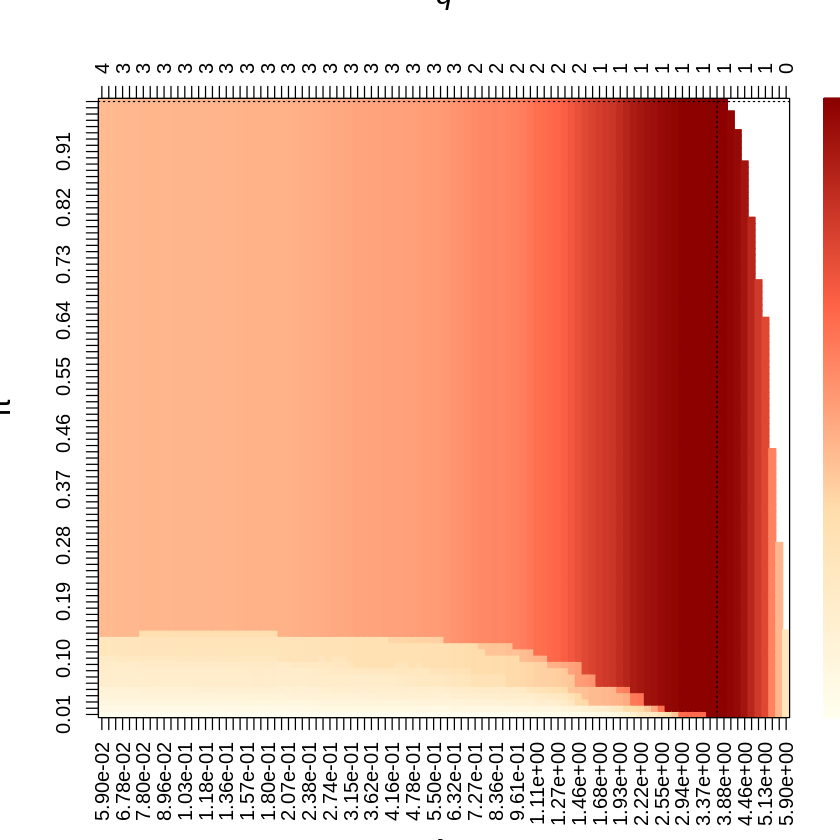

In [41]:
CalibrationPlot(testStab)

In [42]:
##### try on another data frame
dfx <- read_parquet("../output/04_lasso_multivariate/data/bhs_knn_impute_only_x_one_hot_data.parquet")
dfy <- read_parquet("../output/04_lasso_multivariate/data/bhs_knn_impute_only_y_data.parquet")

In [46]:
testStab <- VariableSelection(
    xdata = head(dfx, 300),
    ydata = head(dfy[,1], 300)
)

summary(testStab)

  |======================================================================| 100%

Calibrated parameters: lambda = 8.578 and pi = 0.990

Maximum stability score: 1199.208

Number of selected variable(s): 1


In [47]:
SelectedVariables(testStab)

waist.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                      hip.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                             height_stand.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                              height_seat.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                               townsend_deprivation_index.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                      BMI.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                   weight.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                      age.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                                pm10_2010.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                               pm2.5_2010.0.0 
                                                                                                                                                                                            0 
                                                                                                                                                                           pm2.5_abs_2010.0.0 
                                                                                                                                                                         

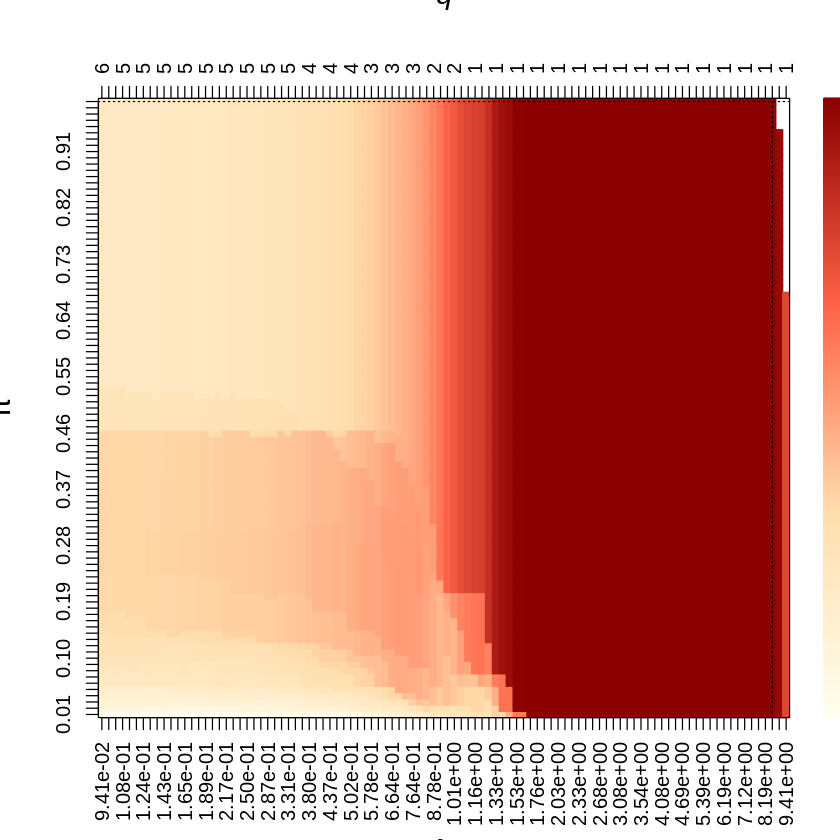

In [48]:
CalibrationPlot(testStab)